In [1]:
import sys
import yaml
import torch
import torchvision
from tqdm import tqdm
from warp_core.utils import load_or_fail

sys.path.append("..")
from utils import *
from train import WurstCoreC, WurstCoreB

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [2]:
# SETUP STAGE C
config_file = '../configs/inference/stage_c_3b.yaml'
with open(config_file, "r", encoding="utf-8") as file:
    loaded_config = yaml.safe_load(file)

core = WurstCoreC(config_dict=loaded_config, device=device, training=False)

# SETUP STAGE B
config_file_b = '../configs/inference/stage_b_3b.yaml'
with open(config_file_b, "r", encoding="utf-8") as file:
    config_file_b = yaml.safe_load(file)
    
core_b = WurstCoreB(config_dict=config_file_b, device=device, training=False)

['model_version', 'effnet_checkpoint_path', 'previewer_checkpoint_path']
['model_version', 'stage_a_checkpoint_path', 'effnet_checkpoint_path']


In [3]:
# SETUP MODELS & DATA
extras = core.setup_extras_pre()
models = core.setup_models(extras)
models.generator.eval().requires_grad_(False)
print("STAGE C READY")

extras_b = core_b.setup_extras_pre()
models_b = core_b.setup_models(extras_b)
models_b.generator.eval().requires_grad_(False)
print("STAGE B READY")

['transforms', 'clip_preprocess', 'gdf', 'sampling_configs', 'effnet_preprocess']


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

['tokenizer', 'text_model', 'generator', 'effnet', 'previewer']
STAGE C READY
['transforms', 'clip_preprocess', 'gdf', 'sampling_configs', 'effnet_preprocess']


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

['tokenizer', 'text_model', 'generator', 'effnet', 'stage_a']
STAGE B READY


## Text-to-Image

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.01it/s]


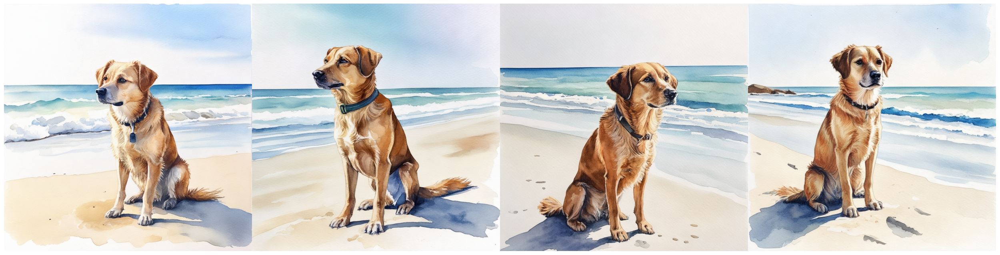

In [5]:
batch_size = 4
caption = "watercolor painting of a dog on the beach"
height, width = 1024, 1024
stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)

# Stage C Parameters
extras.sampling_configs['cfg'] = 4
extras.sampling_configs['shift'] = 2
extras.sampling_configs['timesteps'] = 20
extras.sampling_configs['t_start'] = 1.0

# Stage B Parameters
extras_b.sampling_configs['cfg'] = 1.1
extras_b.sampling_configs['shift'] = 1
extras_b.sampling_configs['timesteps'] = 10
extras_b.sampling_configs['t_start'] = 1.0

# PREPARE CONDITIONS
batch = {'captions': [caption] * batch_size}
conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=False)
unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)

with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    # torch.manual_seed(42)

    sampling_c = extras.gdf.sample(
        models.generator, conditions, stage_c_latent_shape,
        unconditions, device=device, **extras.sampling_configs,
    )
    for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
        sampled_c = sampled_c
        
    # preview_c = models.previewer(sampled_c).float()
    # show_images(preview_c)

    conditions_b['effnet'] = sampled_c
    unconditions_b['effnet'] = torch.zeros_like(sampled_c)

    sampling_b = extras_b.gdf.sample(
        models_b.generator, conditions_b, stage_b_latent_shape,
        unconditions_b, device=device, **extras_b.sampling_configs
    )
    for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
        sampled_b = sampled_b
    sampled_b = models_b.stage_a.decode(sampled_b).float()

show_images(sampled_b)

## Image Variation

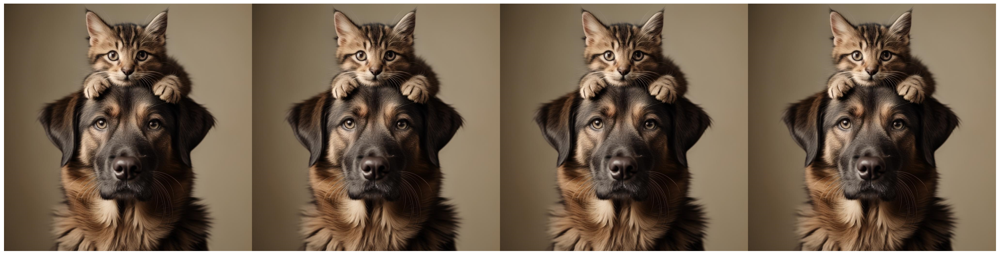

In [5]:
batch_size = 4
url = "https://cdn.discordapp.com/attachments/1121232062708457508/1204787053892603914/cat_dog.png?ex=65d60061&is=65c38b61&hm=37c3d179a39b1eca4b8894e3c239930cedcbb965da00ae2209cca45f883f86f4&"
images = basic_transforms(download_image(url)).unsqueeze(0).expand(batch_size, -1, -1, -1).to(device)

batch = {'images': images}

show_images(batch['images'])

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.02it/s]


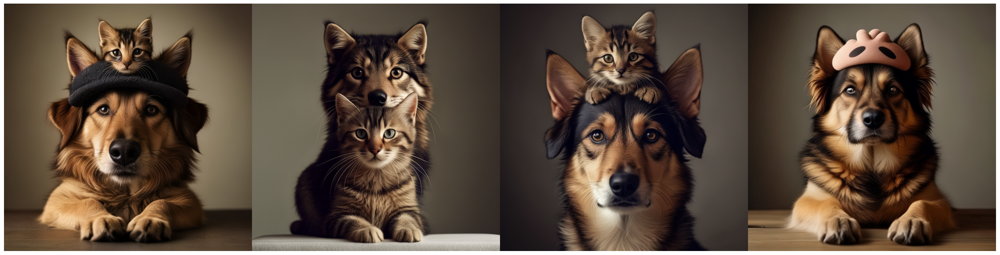

In [14]:
caption = ""
height, width = 1024, 1024
stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)

# Stage C Parameters
extras.sampling_configs['cfg'] = 4
extras.sampling_configs['shift'] = 2
extras.sampling_configs['timesteps'] = 20
extras.sampling_configs['t_start'] = 1.0

# Stage B Parameters
extras_b.sampling_configs['cfg'] = 1.1
extras_b.sampling_configs['shift'] = 1
extras_b.sampling_configs['timesteps'] = 10
extras_b.sampling_configs['t_start'] = 1.0

# PREPARE CONDITIONS
batch['captions'] = [caption] * batch_size

with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    # torch.manual_seed(42)
    conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=True)
    unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
    conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
    unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)

    sampling_c = extras.gdf.sample(
        models.generator, conditions, stage_c_latent_shape,
        unconditions, device=device, **extras.sampling_configs,
    )
    for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
        sampled_c = sampled_c
        
    # preview_c = models.previewer(sampled_c).float()
    # show_images(preview_c)

    conditions_b['effnet'] = sampled_c
    unconditions_b['effnet'] = torch.zeros_like(sampled_c)

    sampling_b = extras_b.gdf.sample(
        models_b.generator, conditions_b, stage_b_latent_shape,
        unconditions_b, device=device, **extras_b.sampling_configs
    )
    for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
        sampled_b = sampled_b
    sampled_b = models_b.stage_a.decode(sampled_b).float()

show_images(sampled_b)

## Image-to-Image

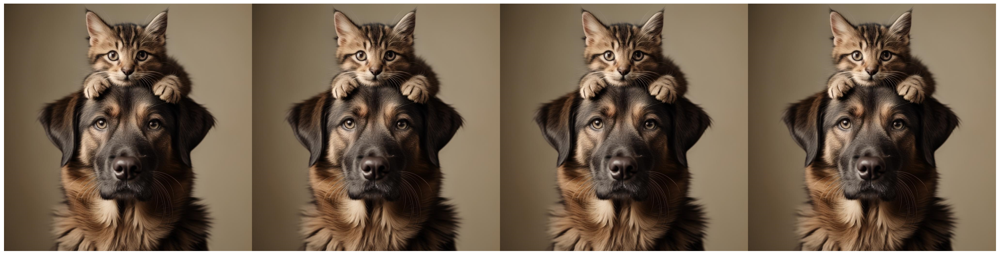

In [4]:
batch_size = 4
url = "https://cdn.discordapp.com/attachments/1121232062708457508/1204787053892603914/cat_dog.png?ex=65d60061&is=65c38b61&hm=37c3d179a39b1eca4b8894e3c239930cedcbb965da00ae2209cca45f883f86f4&"
images = basic_transforms(download_image(url)).unsqueeze(0).expand(batch_size, -1, -1, -1).to(device)

batch = {'images': images}

show_images(batch['images'])

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.01it/s]


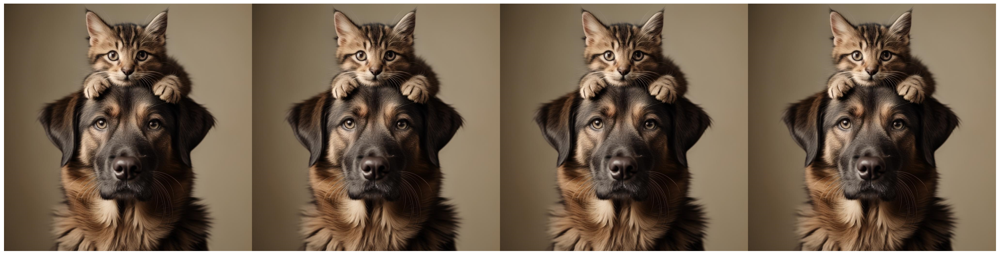

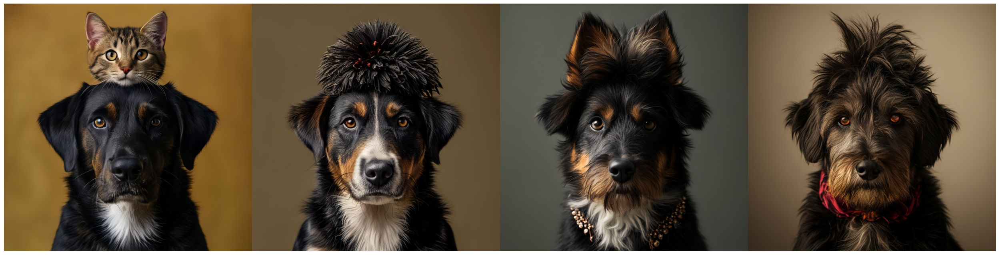

In [9]:
caption = ""
noise_level = 0.8
height, width = 1024, 1024
stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)

effnet_latents = core.encode_latents(batch, models, extras)
t = torch.ones(effnet_latents.size(0), device=device) * noise_level
noised = extras.gdf.diffuse(effnet_latents, t=t)[0]

# Stage C Parameters
extras.sampling_configs['cfg'] = 4
extras.sampling_configs['shift'] = 2
extras.sampling_configs['timesteps'] = int(20 * noise_level)
extras.sampling_configs['t_start'] = noise_level
extras.sampling_configs['x_init'] = noised

# Stage B Parameters
extras_b.sampling_configs['cfg'] = 1.1
extras_b.sampling_configs['shift'] = 1
extras_b.sampling_configs['timesteps'] = 10
extras_b.sampling_configs['t_start'] = 1.0

# PREPARE CONDITIONS
batch['captions'] = [caption] * batch_size

with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    # torch.manual_seed(42)
    conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=False)
    unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
    conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
    unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)

    sampling_c = extras.gdf.sample(
        models.generator, conditions, stage_c_latent_shape,
        unconditions, device=device, **extras.sampling_configs,
    )
    for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
        sampled_c = sampled_c
        
    # preview_c = models.previewer(sampled_c).float()
    # show_images(preview_c)

    conditions_b['effnet'] = sampled_c
    unconditions_b['effnet'] = torch.zeros_like(sampled_c)

    sampling_b = extras_b.gdf.sample(
        models_b.generator, conditions_b, stage_b_latent_shape,
        unconditions_b, device=device, **extras_b.sampling_configs
    )
    for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
        sampled_b = sampled_b
    sampled_b = models_b.stage_a.decode(sampled_b).float()

show_images(batch['images'])
show_images(sampled_b)